In [2]:
from __future__ import annotations
import time
import tkinter
import pathlib
import pickle
import tifffile
import os
import numpy as np
from PIL import (Image, ImageTk, ImageDraw)
from tkinter import filedialog, messagebox
from matplotlib.figure import Figure 
from matplotlib.backends.backend_tkagg import (FigureCanvasTkAgg, NavigationToolbar2Tk)
from matplotlib.patches import Rectangle, Circle
from matplotlib.backend_bases import MouseEvent
from matplotlib.path import Path
from matplotlib.patches import PathPatch
import matplotlib.pyplot as plt
from skimage import measure
import fishCore
import fishGUI
import threading
import concurrent.futures
import cv2
import imageio.v3 as iio
import napari
from aicsimageio import AICSImage

f = fishCore.Fish(pathlib.Path("./config.ini"))
f.set_model_version("3.50")

c:\Users\msgal\Downloads\Ding_Lab\FISH-ML_multichannel\venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


final text_encoder_type: bert-base-uncased


[2026-02-03 23:38:52,999][INFO] CHECK: Model version 3.50 loaded


# Preprocessing Filters and Functions

In [3]:
from skimage.restoration import (
    denoise_tv_chambolle,
    denoise_bilateral,
    denoise_wavelet,
    estimate_sigma,
)

def remove_outliers(img, k=20.0, use_median=False):
    """
    Clip values that are more than k std-dev (or MAD units) above center.
    Args:
        img: 16-bit numpy array
        k: threshold (e.g. 3σ)
        use_median: if True use median+MAD, else mean+std
    Returns:
        clipped float32 image in [0,1]
    """
    x = img.astype(np.float32)

    if use_median:
        med = np.median(x)
        mad = np.median(np.abs(x - med)) + 1e-6
        sigma = 1.4826 * mad  # robust std estimate
        thresh = med + k * sigma
    else:
        mean = np.mean(x)
        std = np.std(x)
        thresh = mean + k * std

    # clip outliers
    x_clipped = np.minimum(x, thresh)

    # normalize after clipping (to 0..1)
    x_norm = (x_clipped - x_clipped.min()) / (x_clipped.max() - x_clipped.min() + 1e-6)
    return x_norm

def normalize_to_uint8(img):
    return cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

def calculate_sigma(img):
    # ----- ESTIMATE SIGMA - Due to clipping in random_noise, the estimate will be a bit smaller than the specified sigma.
    sig = estimate_sigma(img, channel_axis=None, average_sigmas=True)
    print(f'Estimated Gaussian noise standard deviation = {sig}')
    return sig

def clahe_filter(img, clip_limit=4.0, tile_size=(8,8)):
    c = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_size)
    return c.apply(img)

def laplacian(img, cyt_bilat):
    lap = cv2.Laplacian(img, cv2.CV_64F)
    lap = cv2.convertScaleAbs(lap)
    cyt_blended = cv2.addWeighted(cyt_bilat, 0.8, lap, 0.2, 0)
    return cyt_blended

def brightness(img, target_mean=70):
    mean_val = np.mean(img)

    # Compute needed offset (positive = brighten, negative = darken)
    offset = target_mean - mean_val
    # Build a constant image for addition
    adjustment = np.full(img.shape, offset, dtype=np.uint8) if offset > 0 else np.zeros_like(img)
    # Use cv.add to brighten, cv.subtract to darken
    if offset > 0:
        print("Brightness increased")
        result = cv2.add(img, adjustment)
    else:
        print("Brightness remained the same")
        result = img

    return result

In [4]:
from skimage import filters, morphology, measure, segmentation
from scipy import ndimage as ndi

def postproc_mask(m):
    m = morphology.remove_small_objects(m.astype(bool), min_size=200)
    m = morphology.binary_closing(m, footprint=morphology.disk(3))
    m = morphology.binary_opening(m, footprint=morphology.disk(2))
    return m.astype(np.uint8)

def mask_to_bbox(mask):
    ys, xs = np.where(mask)
    if len(xs) == 0 or len(ys) == 0:
        return None
    return (xs.min(), ys.min(), xs.max(), ys.max())

def watershed_segment_with_centers(cyt_img, centers):
    thresh = filters.threshold_otsu(cyt_img)
    binary = cyt_img > thresh
    binary = morphology.remove_small_holes(binary, area_threshold=1000)
    # binary = morphology.remove_small_objects(binary, min_size=1000)
    dist = ndi.distance_transform_edt(binary)

    markers = np.zeros(cyt_img.shape, dtype=np.int32)
    for i, (cx, cy) in enumerate(centers, start=1):
        xi, yi = int(round(cx)), int(round(cy))
        if 0 <= yi < cyt_img.shape[0] and 0 <= xi < cyt_img.shape[1]:
            markers[yi, xi] = i

    edges = filters.sobel(cyt_img)
    elevation = -dist + 5 * edges
    labels = segmentation.watershed(elevation, markers=markers, mask=binary)

    masks = []
    for i in range(1, np.max(labels)+1):
        mask = (labels == i)
        if np.sum(mask) > 0:
            masks.append(postproc_mask(mask))
    return masks

# Load Matlab

In [5]:
import scipy.io

def load_matlab_data(mat_file):
    """Load data from a .mat file and store it in a dictionary."""
    file = pathlib.Path(mat_file)
    mat = scipy.io.loadmat(file)
    return mat
mat = load_matlab_data("Z:/Guohao/For Computation group/EXP251009COL/matlabEXP251009COL_251022_1739_all_track.mat")

track = mat["Track251009COLA01"]
type(track), getattr(track, "dtype", None), getattr(track, "shape", None)


(numpy.ndarray, dtype('O'), (1, 5))

In [6]:
# --- SAVE DIRNAMES ---
# Saves all the necessary directory names in a list

all_keys = mat.keys()
print("Total keys:", len(all_keys))
dirnames = []
for k in all_keys:
    if k.startswith("Track"):
        dirnames.append(k)
        print(k)

Total keys: 17
Track251009COLA01
Track251009COLA02
Track251009COLA03
Track251009COLB01
Track251009COLB02
Track251009COLB03
Track251009COLC01
Track251009COLC02
Track251009COLD01
Track251009COLD02
Track251009COLE01
Track251009COLE02
Track251009COLF01
Track251009COLF02


In [7]:
# --- STORE CORRESPONDING NAMES ---
dirnames = {
    "Track251009COLA01": "EXP251009COLA01",
    "Track251009COLA02": "EXP251009COLA02",
    "Track251009COLA03": "EXP251009COLA03",
    "Track251009COLB01": "EXP251009COLB01",
    "Track251009COLB02": "EXP251009COLB02",
    "Track251009COLB03": "EXP251009COLB03",
    "Track251009COLC01": "EXP251009COLC01",
    "Track251009COLC02": "EXP251009COLC02",
    "Track251009COLD01": "EXP251009COLD01",
    "Track251009COLD02": "EXP251009COLD02",
    "Track251009COLE01": "EXP251009COLE01",
    "Track251009COLE02": "EXP251009COLE02",
    "Track251009COLF01": "EXP251009COLF01",
    "Track251009COLF02": "EXP251009COLF02"
}



### Visualizing masks in one run

I will be separating the results for better visualization

In [ ]:
# --- USE THIS IF YOU WANT IT ALL IN ONE GO ---
for dir in dirnames:
    track = mat[dir] # Makes a new track for each directory
    num_img = len(track[0]) # Number of images in the directory

# Functions for Preparing TIFF Files

In [8]:
def open_tiff_file(image_path):
    with tifffile.TiffFile(image_path) as tif:
        channel = tif.pages[0].asarray()

    return channel

In [9]:
def segment_channel(nucleus, channel):
    cyt_removed = remove_outliers(channel)
    cyt_norm = normalize_to_uint8(cyt_removed)

    sigma_est = calculate_sigma(channel) # Calculate sigma

    cyt_clahe = clahe_filter(cyt_norm) 

    sigma_est = calculate_sigma(cyt_clahe)
    sigma_norm = sigma_est + 3.0
    sigma_weak = sigma_est - 10.0

    cyt_bilat = cv2.bilateralFilter(cyt_clahe, d=9, sigmaColor=sigma_norm, sigmaSpace=15, borderType=cv2.BORDER_REFLECT_101)
    cyt_edge_preserved = cv2.edgePreservingFilter(cyt_clahe, flags=1, sigma_s=sigma_norm, sigma_r=0.4)
    cyt_bilat_edge = cv2.edgePreservingFilter(cyt_bilat, flags=1, sigma_s=sigma_weak, sigma_r=0.4)
    cyt_blended = laplacian(cyt_norm, cyt_bilat)

    # --------
    # Stacking
    # --------
    cyt_rgb = np.stack([cyt_blended, cyt_bilat, cyt_edge_preserved], axis=-1)
    bbox_nucleus = f.AppIntDINOwrapper(nucleus) 
    centers = [((x1 + x2) / 2, (y1 + y2) / 2) for x1, y1, x2, y2 in bbox_nucleus]

    # --- Creating Masks ---
    masks_bilat_edge = watershed_segment_with_centers(cyt_bilat_edge, centers)

    # --- Creating BBoxes ---
    bbox_cyto = [mask_to_bbox(m) for m in masks_bilat_edge]
    bbox_cyto = [b for b in bbox_cyto if b is not None]
    bbox_cyto = [
        [float(x1), float(y1), float(x2), float(y2)] 
        for (x1, y1, x2, y2) in bbox_cyto
    ]


    # -----------------------------
    # SAM segmentation guided by boxes
    # -----------------------------
    masks_all = f.finetune.AppIntPREDICTCytoplasmWrapper(cyt_rgb, bbox_cyto)

    masks = []
    for mset in masks_all:
        areas = [(mm > 0).sum() for mm in mset]
        best = mset[np.argmax(areas)]
        masks.append(postproc_mask(best))

    return masks, centers, cyt_clahe


# Functions for Preparing Masks

In [10]:
import numpy as np

def frame_combined_mask(cells, mask_idx):
    """
    cells: output of getCells(frame_dict)
    mask_idx: which entry inside each cell is the 2D binary mask
    """
    combined = None
    for c in cells:
        m = c[mask_idx]
        if not isinstance(m, np.ndarray) or m.ndim != 2:
            continue
        m = (m > 0).astype(np.uint8)

        if combined is None:
            combined = np.zeros_like(m, dtype=np.uint8)
        combined |= m
    return combined


In [11]:
def convert(all_frames):
    converted: list[dict] = []
    for i in range(all_frames.shape[0]):
        cur = dict()
        # use try catch to avoid error on edge cases
        try:
            for j in range(100):
                cur[j] = all_frames[i][0,0][j][0] 
        except IndexError:
            pass
        converted.append(cur)
    return converted

In [12]:
def getCells(rec, cellsInfoIndex=12):
    cells_container = rec["cells"]
    
    if isinstance(cells_container, np.ndarray):
        if cells_container.size == 0:
            return []
        cells_iter = cells_container.ravel()
    else:
        cells_iter = [cells_container]

    cells = []
    for obj in cells_iter:
        if isinstance(obj, np.ndarray) and obj.shape == (1, 1):
            obj = obj[0, 0]

        info = []
        for j in range(cellsInfoIndex):
            info.append(obj[j])
        cells.append(info)

    return cells

In [13]:
def reconstruct_instance_mask(frame_dict, H, W, mask_idx=0, pos_idx=1):
    """
    Returns an instance-labeled mask:
    0 = background
    1..N = individual cells
    """
    inst_mask = np.zeros((H, W), dtype=np.int32)
    cells = getCells(frame_dict)

    for i, cell in enumerate(cells, start=1):
        m = cell[mask_idx]
        if not isinstance(m, np.ndarray) or m.size == 0:
            continue

        m = (m > 0)

        pos = cell[pos_idx].astype(int).ravel()
        if len(pos) != 2:
            continue

        y0, x0 = pos
        y0 -= 1
        x0 -= 1

        h, w = m.shape
        y1 = min(y0 + h, H)
        x1 = min(x0 + w, W)

        inst_mask[y0:y1, x0:x1][m[:y1-y0, :x1-x0]] = i

    return inst_mask


# Visualizing Comparisons

### Setup

In [14]:
# ---- GET IMAGE SIZE ----

img = tifffile.imread(r"Z:\Guohao\For Computation group\EXP251009COL\EXP251009COLA01\MAXEXP251009COLA01_w1-DAPI_s001.tif")
H, W = img.shape[-2], img.shape[-1]

In [15]:
iou_metrics = []
dice_metrics = []

all_pred_bt_masks = []
all_gt_bt_masks = []

In [16]:
def calculate_semantic_metrics(masks_488, inst_mask):
    gt_binary = (inst_mask > 0).astype(np.uint8)

    pred_binary = np.zeros_like(gt_binary, dtype=np.uint8)
    for m in masks_488:
        pred_binary |= (m > 0)

    intersection = np.logical_and(gt_binary, pred_binary).sum()
    union = np.logical_or(gt_binary, pred_binary).sum()

    iou = intersection / union if union > 0 else 0.0
    dice = (2 * intersection) / (gt_binary.sum() + pred_binary.sum()) if (gt_binary.sum() + pred_binary.sum()) > 0 else 0.0

    print("Semantic IoU:", iou)
    print("Semantic Dice:", dice)


    return iou, dice, gt_binary, pred_binary

## EXP251009COLA01

In [17]:
path_A01 = "Z:/Guohao/For Computation group/EXP251009COL/EXP251009COLA01"
chnl_dapi = []
chnl_488 = []
chnl_647 = []

with os.scandir(path_A01) as entries:
    for entry in entries:
        if "DAPI" in entry.name:
            chnl_dapi.append(entry.name)
        elif "488" in entry.name:
            chnl_488.append(entry.name)
        elif "647" in entry.name:
            chnl_647.append(entry.name)


chnl_dapi = sorted(chnl_dapi)
chnl_488 = sorted(chnl_488)
chnl_647 = sorted(chnl_647)

Estimated Gaussian noise standard deviation = 6.761285010446505
Estimated Gaussian noise standard deviation = 28.41095007812834
DEBUG: Running dino_bbox


DEBUG: DINO predicted 54 boxes
[CYTO] Starting prediction for 18 cells
[CYTO] Input image shape: (2048, 2048, 3), dtype: uint8
[CYTO] Using pre-formatted 3-channel image as RGB
[CYTO] Processing box [1487.0, 1357.0, 1697.0, 1544.0]
[CYTO] Processing box [1049.0, 1031.0, 1254.0, 1240.0]
[CYTO] Processing box [1591.0, 727.0, 1787.0, 930.0]
[CYTO] Processing box [1424.0, 1665.0, 1652.0, 1853.0]
[CYTO] Processing box [566.0, 0.0, 1014.0, 357.0]
[CYTO] Processing box [1141.0, 1693.0, 1425.0, 1960.0]
[CYTO] Processing box [1145.0, 640.0, 1442.0, 811.0]
[CYTO] Processing box [89.0, 954.0, 277.0, 1193.0]
[CYTO] Processing box [1444.0, 1516.0, 1598.0, 1665.0]
[CYTO] Processing box [558.0, 360.0, 781.0, 578.0]
[CYTO] Processing box [664.0, 1137.0, 872.0, 1345.0]
[CYTO] Processing box [71.0, 1168.0, 340.0, 1400.0]
[CYTO] Processing box [26.0, 1397.0, 567.0, 1981.0]
[CYTO] Processing box [1252.0, 106.0, 1531.0, 495.0]
[CYTO] Processing box [423.0, 1194.0, 675.0, 1380.0]
[CYTO] Processing box [14.0

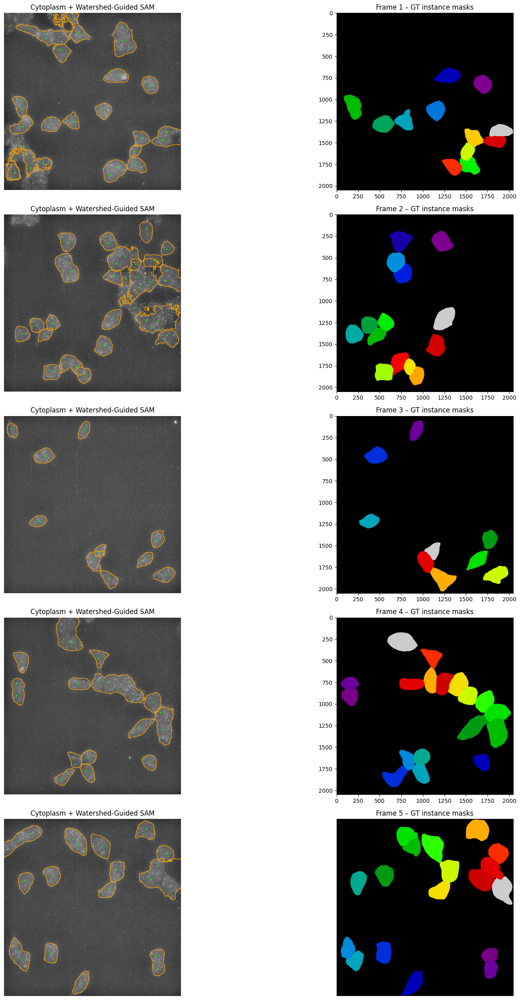

In [18]:
# --- USE THIS IF YOU WANT IT ALL IN ONE GO ---
mat_A01 = "Track251009COLA01"
dir_A01 = dirnames[mat_A01] #EXP251009COLA01

track = mat[mat_A01] # Makes a new track 
num_frames = track.shape[1] # Number of images in the directory
frame_converted = convert(track[0])

fig, ax = plt.subplots(5, 2, figsize=(20,25))

for index in range(num_frames): # Loops over all frames in folder

    # ----- GDINO + SAM -----

    # Get correct DAPI, 488, and 647 frames
    path_dapi = os.path.join(path_A01, chnl_dapi[index])
    path_488 = os.path.join(path_A01, chnl_488[index])
    path_647 = os.path.join(path_A01, chnl_647[index])

    nucleus = open_tiff_file(path_dapi)
    img_488 = open_tiff_file(path_488)
    img_647 = open_tiff_file(path_647)

    masks_488, centers_488, clahe_488 = segment_channel(nucleus, img_488) # Just 488 for now
    # masks_647, centers_647 = segment_channel(nucleus, img_647)

    # Cytoplasm + masks
    ax[index, 0].imshow(clahe_488, cmap='gray')
    ax[index, 0].set_title("Cytoplasm + Watershed-Guided SAM")
    ax[index, 0].axis('off')
    for mask in masks_488:
        for contour in measure.find_contours(mask, 0.5):
            ax[index, 0].plot(contour[:, 1], contour[:, 0], linewidth=1, color='orange')
    # Debug: plot all nucleus centers in cytoplasm plot
    for (cx, cy) in centers_488:
        ax[index, 0].add_patch(Circle((cx, cy), radius=5, color='lime', fill=True))

    # ----- GT MASKS -----
    rec = track[0, index][0, 0]
    inst_mask = reconstruct_instance_mask(rec, H, W) # This function calls getCells to calculate instance masks
    ax[index, 1].imshow(inst_mask, cmap="nipy_spectral")
    ax[index, 1].set_title(f"Frame {index + 1} – GT instance masks")

    # ----- CALCULATE AND STORE METRICS AND BT MASKS -----
    iou, dice, gt_binary, pred_binary = calculate_semantic_metrics(masks_488, inst_mask)

    iou_metrics.append(iou)
    dice_metrics.append(dice)
    all_gt_bt_masks.append(gt_binary)
    all_pred_bt_masks.append(pred_binary)

plt.axis("off")
plt.tight_layout()
plt.show()


In [19]:
print(len(all_pred_bt_masks))
print(num_frames)

5
5


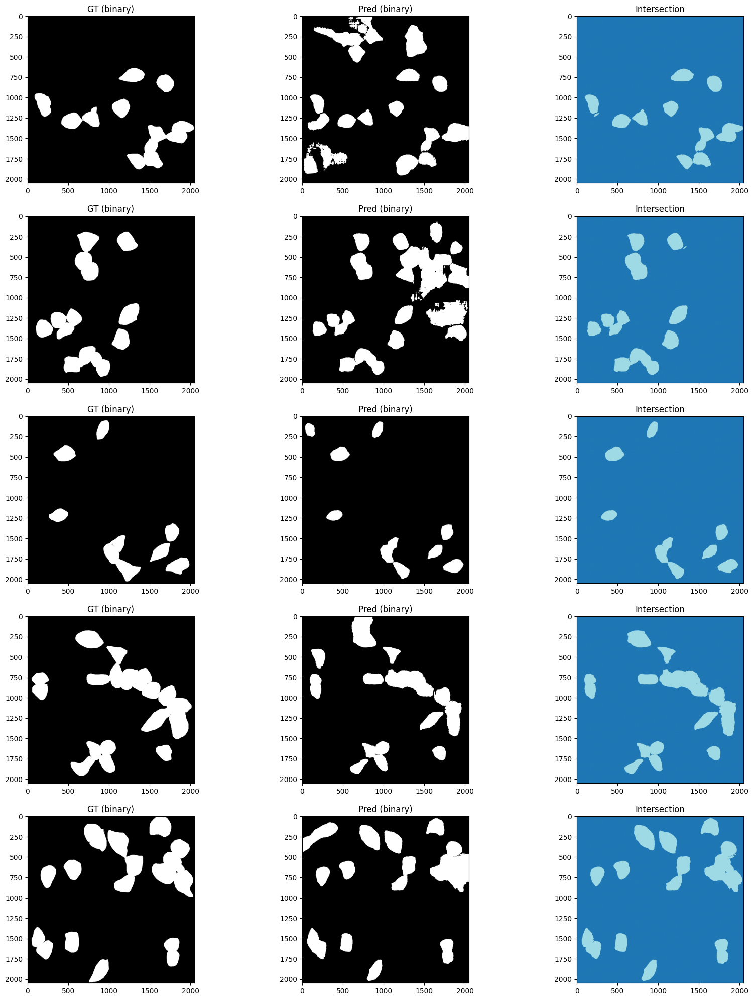

In [20]:
fig, axs = plt.subplots(5, 3, figsize=(20,25))

for index in range(5):
    axs[index, 0].imshow(all_gt_bt_masks[index], cmap="gray")
    axs[index, 0].set_title("GT (binary)")

    axs[index, 1].imshow(all_pred_bt_masks[index], cmap="gray")
    axs[index, 1].set_title("Pred (binary)")

    axs[index, 2].imshow(all_gt_bt_masks[index] & all_pred_bt_masks[index], cmap="tab20")
    axs[index,2].set_title("Intersection")

plt.show()

In [73]:
print(len(iou_metrics)) 
dice_metrics

all_pred_bt_masks 
all_gt_bt_masks

12


[array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
 array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
 array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
 array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint8),
 array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0

## EXP251009COLA02

In [18]:
iou_metrics = []
dice_metrics = []

all_pred_bt_masks = []
all_gt_bt_masks = []

In [19]:
path_A02 = "Z:/Guohao/For Computation group/EXP251009COL/EXP251009COLA02"
chnl_dapi = []
chnl_488 = []
chnl_647 = []

with os.scandir(path_A02) as entries:
    for entry in entries:
        if "DAPI" in entry.name:
            chnl_dapi.append(entry.name)
        elif "488" in entry.name:
            chnl_488.append(entry.name)
        elif "647" in entry.name:
            chnl_647.append(entry.name)


chnl_dapi = sorted(chnl_dapi)
chnl_488 = sorted(chnl_488)
chnl_647 = sorted(chnl_647)

Estimated Gaussian noise standard deviation = 6.5311722195476625
Estimated Gaussian noise standard deviation = 20.901839067613476
DEBUG: Running dino_bbox
DEBUG: DINO predicted 24 boxes
[CYTO] Starting prediction for 9 cells
[CYTO] Input image shape: (2048, 2048, 3), dtype: uint8
[CYTO] Using pre-formatted 3-channel image as RGB
[CYTO] Processing box [1572.0, 1053.0, 1809.0, 1222.0]
[CYTO] Processing box [1116.0, 860.0, 1349.0, 1019.0]
[CYTO] Processing box [1684.0, 302.0, 1891.0, 477.0]
[CYTO] Processing box [1176.0, 1176.0, 1444.0, 1466.0]
[CYTO] Processing box [1012.0, 1011.0, 1209.0, 1188.0]
[CYTO] Processing box [495.0, 1595.0, 646.0, 1723.0]
[CYTO] Processing box [1519.0, 1384.0, 1866.0, 1658.0]
[CYTO] Processing box [104.0, 1260.0, 573.0, 1882.0]
[CYTO] Processing box [1686.0, 1650.0, 1960.0, 1894.0]
Semantic IoU: 0.45317466228388886
Semantic Dice: 0.6237029505753352
Estimated Gaussian noise standard deviation = 6.713409885375555
Estimated Gaussian noise standard deviation = 28.

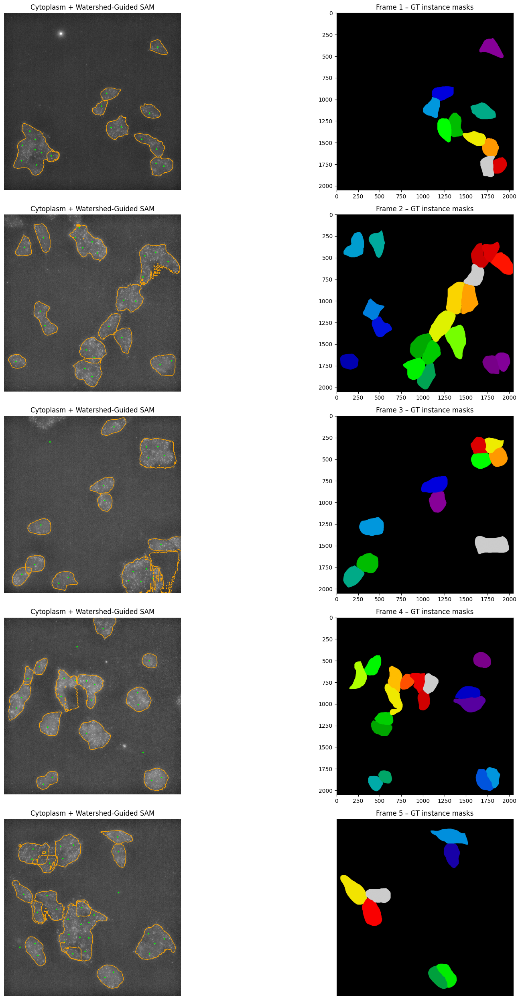

In [24]:
# --- USE THIS IF YOU WANT IT ALL IN ONE GO ---
mat_A02 = "Track251009COLA02"
dir_A02 = dirnames[mat_A02] #EXP251009COLA01

track = mat[mat_A02] # Makes a new track 
num_frames = track.shape[1] # Number of images in the directory
frame_converted = convert(track[0])

fig, ax = plt.subplots(5, 2, figsize=(20,25))

for index in range(num_frames): # Loops over all frames in folder

    # ----- GDINO + SAM -----

    # Get correct DAPI, 488, and 647 frames
    path_dapi = os.path.join(path_A02, chnl_dapi[index])
    path_488 = os.path.join(path_A02, chnl_488[index])
    path_647 = os.path.join(path_A02, chnl_647[index])

    nucleus = open_tiff_file(path_dapi)
    img_488 = open_tiff_file(path_488)
    img_647 = open_tiff_file(path_647)

    masks_488, centers_488, clahe_488 = segment_channel(nucleus, img_488) # Just 488 for now
    # masks_647, centers_647 = segment_channel(nucleus, img_647)

    # Cytoplasm + masks
    ax[index, 0].imshow(clahe_488, cmap='gray')
    ax[index, 0].set_title("Cytoplasm + Watershed-Guided SAM")
    ax[index, 0].axis('off')
    for mask in masks_488:
        for contour in measure.find_contours(mask, 0.5):
            ax[index, 0].plot(contour[:, 1], contour[:, 0], linewidth=1, color='orange')
    # Debug: plot all nucleus centers in cytoplasm plot
    for (cx, cy) in centers_488:
        ax[index, 0].add_patch(Circle((cx, cy), radius=5, color='lime', fill=True))

    # ----- GT MASKS -----
    rec = track[0, index][0, 0]
    inst_mask = reconstruct_instance_mask(rec, H, W) # This function calls getCells to calculate instance masks
    ax[index, 1].imshow(inst_mask, cmap="nipy_spectral")
    ax[index, 1].set_title(f"Frame {index + 1} – GT instance masks")

    # ----- CALCULATE AND STORE METRICS AND BT MASKS -----
    iou, dice, gt_binary, pred_binary = calculate_semantic_metrics(masks_488, inst_mask)

    iou_metrics.append(iou)
    dice_metrics.append(dice)
    all_gt_bt_masks.append(gt_binary)
    all_pred_bt_masks.append(pred_binary)

plt.axis("off")
plt.tight_layout()
plt.show()


In [25]:
print(len(all_pred_bt_masks))
print(num_frames)

5
5


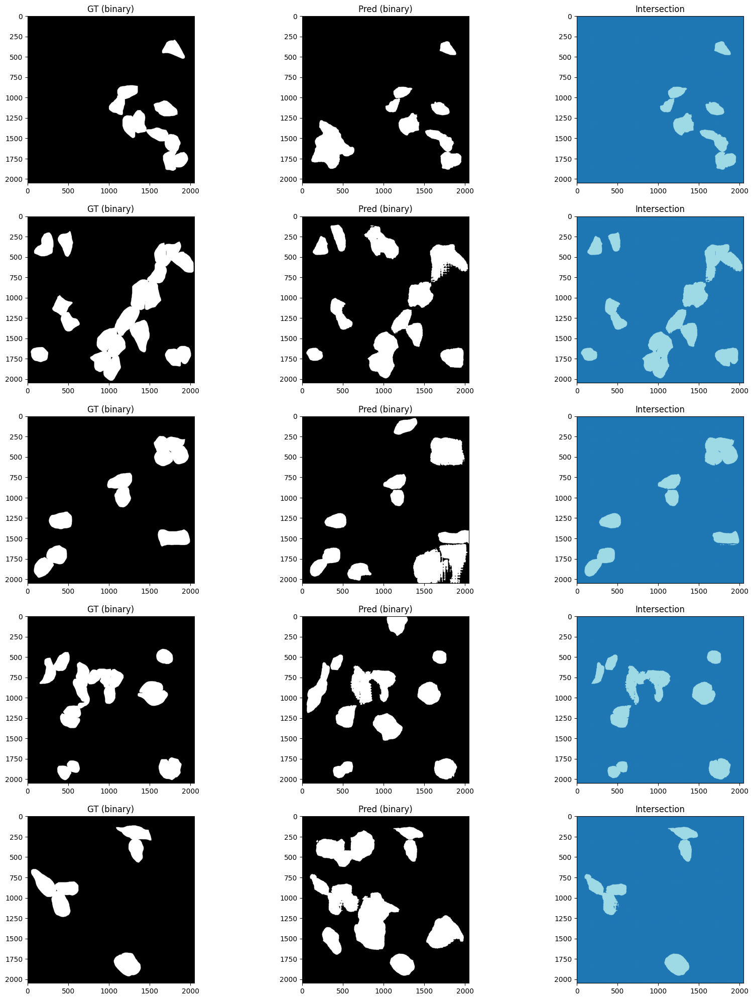

In [26]:
fig, axs = plt.subplots(5, 3, figsize=(20,25))

for index in range(5):
    axs[index, 0].imshow(all_gt_bt_masks[index], cmap="gray")
    axs[index, 0].set_title("GT (binary)")

    axs[index, 1].imshow(all_pred_bt_masks[index], cmap="gray")
    axs[index, 1].set_title("Pred (binary)")

    axs[index, 2].imshow(all_gt_bt_masks[index] & all_pred_bt_masks[index], cmap="tab20")
    axs[index,2].set_title("Intersection")

plt.show()

## EXP251009COLA03

In [28]:
iou_metrics = []
dice_metrics = []

all_pred_bt_masks = []
all_gt_bt_masks = []

In [29]:
path_A03 = "Z:/Guohao/For Computation group/EXP251009COL/EXP251009COLA03"
chnl_dapi = []
chnl_488 = []
chnl_647 = []

with os.scandir(path_A03) as entries:
    for entry in entries:
        if "DAPI" in entry.name:
            chnl_dapi.append(entry.name)
        elif "488" in entry.name:
            chnl_488.append(entry.name)
        elif "647" in entry.name:
            chnl_647.append(entry.name)


chnl_dapi = sorted(chnl_dapi)
chnl_488 = sorted(chnl_488)
chnl_647 = sorted(chnl_647)

Estimated Gaussian noise standard deviation = 6.497430173740103
Estimated Gaussian noise standard deviation = 26.050551908445858
DEBUG: Running dino_bbox


DEBUG: DINO predicted 58 boxes
[CYTO] Starting prediction for 21 cells
[CYTO] Input image shape: (2048, 2048, 3), dtype: uint8
[CYTO] Using pre-formatted 3-channel image as RGB
[CYTO] Processing box [361.0, 900.0, 860.0, 1251.0]
[CYTO] Processing box [1154.0, 1577.0, 1340.0, 1815.0]
[CYTO] Processing box [790.0, 787.0, 924.0, 1014.0]
[CYTO] Processing box [1503.0, 249.0, 1730.0, 415.0]
[CYTO] Processing box [284.0, 648.0, 482.0, 799.0]
[CYTO] Processing box [952.0, 131.0, 1170.0, 313.0]
[CYTO] Processing box [876.0, 615.0, 1078.0, 793.0]
[CYTO] Processing box [71.0, 686.0, 284.0, 848.0]
[CYTO] Processing box [837.0, 47.0, 1014.0, 220.0]
[CYTO] Processing box [1359.0, 384.0, 1555.0, 669.0]
[CYTO] Processing box [945.0, 1788.0, 1252.0, 2023.0]
[CYTO] Processing box [570.0, 554.0, 903.0, 863.0]
[CYTO] Processing box [1375.0, 1112.0, 1539.0, 1361.0]
[CYTO] Processing box [1281.0, 963.0, 1453.0, 1207.0]
[CYTO] Processing box [1373.0, 1800.0, 1669.0, 2047.0]
[CYTO] Processing box [1646.0, 12

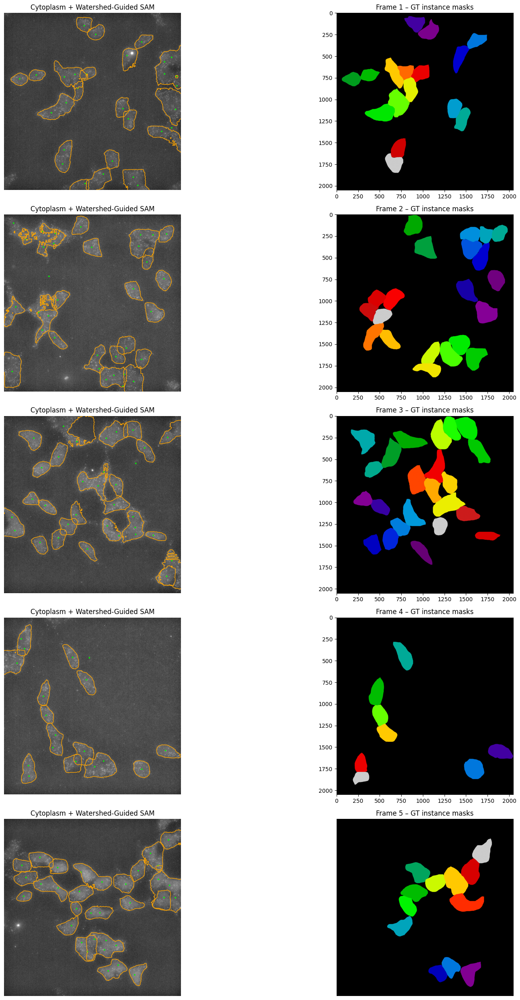

In [30]:
# --- USE THIS IF YOU WANT IT ALL IN ONE GO ---
mat_A03 = "Track251009COLA03"
dir_A03 = dirnames[mat_A03] #EXP251009COLA01

track = mat[mat_A03] # Makes a new track 
num_frames = track.shape[1] # Number of images in the directory
frame_converted = convert(track[0])

fig, ax = plt.subplots(5, 2, figsize=(20,25))

for index in range(num_frames): # Loops over all frames in folder

    # ----- GDINO + SAM -----

    # Get correct DAPI, 488, and 647 frames
    path_dapi = os.path.join(path_A03, chnl_dapi[index])
    path_488 = os.path.join(path_A03, chnl_488[index])
    path_647 = os.path.join(path_A03, chnl_647[index])

    nucleus = open_tiff_file(path_dapi)
    img_488 = open_tiff_file(path_488)
    img_647 = open_tiff_file(path_647)

    masks_488, centers_488, clahe_488 = segment_channel(nucleus, img_488) # Just 488 for now
    # masks_647, centers_647 = segment_channel(nucleus, img_647)

    # Cytoplasm + masks
    ax[index, 0].imshow(clahe_488, cmap='gray')
    ax[index, 0].set_title("Cytoplasm + Watershed-Guided SAM")
    ax[index, 0].axis('off')
    for mask in masks_488:
        for contour in measure.find_contours(mask, 0.5):
            ax[index, 0].plot(contour[:, 1], contour[:, 0], linewidth=1, color='orange')
    # Debug: plot all nucleus centers in cytoplasm plot
    for (cx, cy) in centers_488:
        ax[index, 0].add_patch(Circle((cx, cy), radius=5, color='lime', fill=True))

    # ----- GT MASKS -----
    rec = track[0, index][0, 0]
    inst_mask = reconstruct_instance_mask(rec, H, W) # This function calls getCells to calculate instance masks
    ax[index, 1].imshow(inst_mask, cmap="nipy_spectral")
    ax[index, 1].set_title(f"Frame {index + 1} – GT instance masks")

    # ----- CALCULATE AND STORE METRICS AND BT MASKS -----
    iou, dice, gt_binary, pred_binary = calculate_semantic_metrics(masks_488, inst_mask)

    iou_metrics.append(iou)
    dice_metrics.append(dice)
    all_gt_bt_masks.append(gt_binary)
    all_pred_bt_masks.append(pred_binary)

plt.axis("off")
plt.tight_layout()
plt.show()


In [31]:
print(len(all_pred_bt_masks))
print(num_frames)

5
5


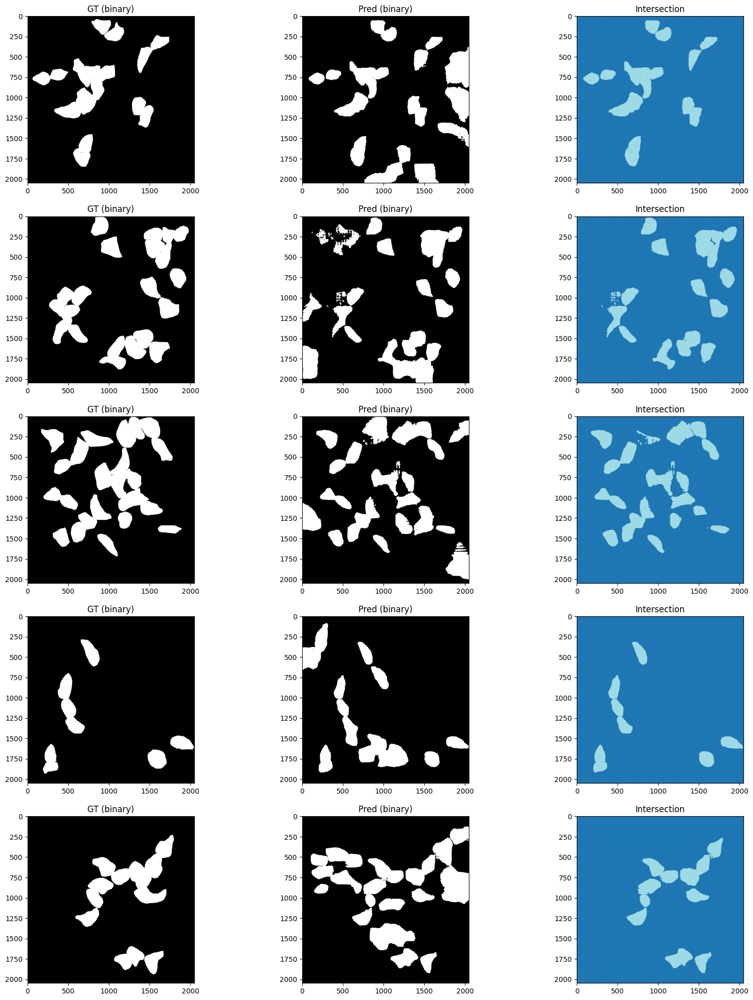

In [32]:
fig, axs = plt.subplots(5, 3, figsize=(20,25))

for index in range(5):
    axs[index, 0].imshow(all_gt_bt_masks[index], cmap="gray")
    axs[index, 0].set_title("GT (binary)")

    axs[index, 1].imshow(all_pred_bt_masks[index], cmap="gray")
    axs[index, 1].set_title("Pred (binary)")

    axs[index, 2].imshow(all_gt_bt_masks[index] & all_pred_bt_masks[index], cmap="tab20")
    axs[index,2].set_title("Intersection")

plt.show()

## EXP251009COLB01

In [33]:
iou_metrics = []
dice_metrics = []

all_pred_bt_masks = []
all_gt_bt_masks = []

In [34]:
path_B01 = "Z:/Guohao/For Computation group/EXP251009COL/EXP251009COLB01"
chnl_dapi = []
chnl_488 = []
chnl_647 = []

with os.scandir(path_B01) as entries:
    for entry in entries:
        if "DAPI" in entry.name:
            chnl_dapi.append(entry.name)
        elif "488" in entry.name:
            chnl_488.append(entry.name)
        elif "647" in entry.name:
            chnl_647.append(entry.name)


chnl_dapi = sorted(chnl_dapi)
chnl_488 = sorted(chnl_488)
chnl_647 = sorted(chnl_647)

Estimated Gaussian noise standard deviation = 6.656621593693634
Estimated Gaussian noise standard deviation = 28.68098013780535
DEBUG: Running dino_bbox


DEBUG: DINO predicted 53 boxes
[CYTO] Starting prediction for 16 cells
[CYTO] Input image shape: (2048, 2048, 3), dtype: uint8
[CYTO] Using pre-formatted 3-channel image as RGB
[CYTO] Processing box [772.0, 721.0, 1203.0, 1009.0]
[CYTO] Processing box [656.0, 0.0, 992.0, 490.0]
[CYTO] Processing box [527.0, 1588.0, 694.0, 1728.0]
[CYTO] Processing box [1495.0, 1185.0, 1800.0, 1467.0]
[CYTO] Processing box [628.0, 1553.0, 951.0, 2006.0]
[CYTO] Processing box [1733.0, 1505.0, 1939.0, 1664.0]
[CYTO] Processing box [1764.0, 190.0, 1973.0, 376.0]
[CYTO] Processing box [0.0, 128.0, 268.0, 448.0]
[CYTO] Processing box [1758.0, 1659.0, 1893.0, 1867.0]
[CYTO] Processing box [1686.0, 10.0, 1918.0, 223.0]
[CYTO] Processing box [719.0, 1001.0, 1124.0, 1256.0]
[CYTO] Processing box [107.0, 1283.0, 504.0, 1876.0]
[CYTO] Processing box [0.0, 634.0, 243.0, 874.0]
[CYTO] Processing box [764.0, 1948.0, 786.0, 1980.0]
[CYTO] Processing box [582.0, 1883.0, 647.0, 1957.0]
[CYTO] Processing box [1474.0, 972

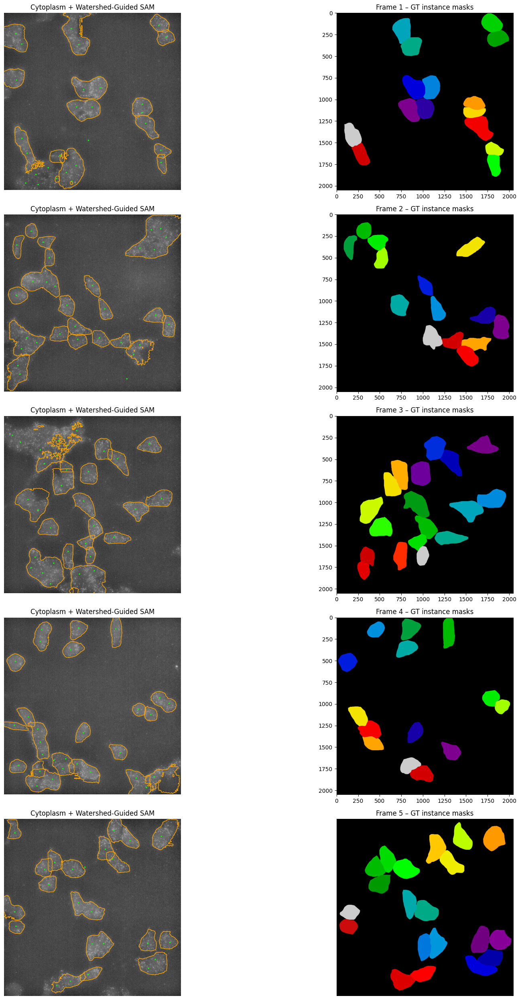

In [35]:
# --- USE THIS IF YOU WANT IT ALL IN ONE GO ---
mat_B01 = "Track251009COLB01"
dir_B01 = dirnames[mat_B01] #EXP251009COLA01

track = mat[mat_B01] # Makes a new track 
num_frames = track.shape[1] # Number of images in the directory
frame_converted = convert(track[0])

fig, ax = plt.subplots(5, 2, figsize=(20,25))

for index in range(num_frames): # Loops over all frames in folder

    # ----- GDINO + SAM -----

    # Get correct DAPI, 488, and 647 frames
    path_dapi = os.path.join(path_B01, chnl_dapi[index])
    path_488 = os.path.join(path_B01, chnl_488[index])
    path_647 = os.path.join(path_B01, chnl_647[index])

    nucleus = open_tiff_file(path_dapi)
    img_488 = open_tiff_file(path_488)
    img_647 = open_tiff_file(path_647)

    masks_488, centers_488, clahe_488 = segment_channel(nucleus, img_488) # Just 488 for now
    # masks_647, centers_647 = segment_channel(nucleus, img_647)

    # Cytoplasm + masks
    ax[index, 0].imshow(clahe_488, cmap='gray')
    ax[index, 0].set_title("Cytoplasm + Watershed-Guided SAM")
    ax[index, 0].axis('off')
    for mask in masks_488:
        for contour in measure.find_contours(mask, 0.5):
            ax[index, 0].plot(contour[:, 1], contour[:, 0], linewidth=1, color='orange')
    # Debug: plot all nucleus centers in cytoplasm plot
    for (cx, cy) in centers_488:
        ax[index, 0].add_patch(Circle((cx, cy), radius=5, color='lime', fill=True))

    # ----- GT MASKS -----
    rec = track[0, index][0, 0]
    inst_mask = reconstruct_instance_mask(rec, H, W) # This function calls getCells to calculate instance masks
    ax[index, 1].imshow(inst_mask, cmap="nipy_spectral")
    ax[index, 1].set_title(f"Frame {index + 1} – GT instance masks")

    # ----- CALCULATE AND STORE METRICS AND BT MASKS -----
    iou, dice, gt_binary, pred_binary = calculate_semantic_metrics(masks_488, inst_mask)

    iou_metrics.append(iou)
    dice_metrics.append(dice)
    all_gt_bt_masks.append(gt_binary)
    all_pred_bt_masks.append(pred_binary)

plt.axis("off")
plt.tight_layout()
plt.show()


In [36]:
print("Predicted Masks", all_pred_bt_masks)
print()
print("Ground Truth Masks", all_gt_bt_masks)

Predicted Masks [array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8), array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8), array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8), array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8), array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,

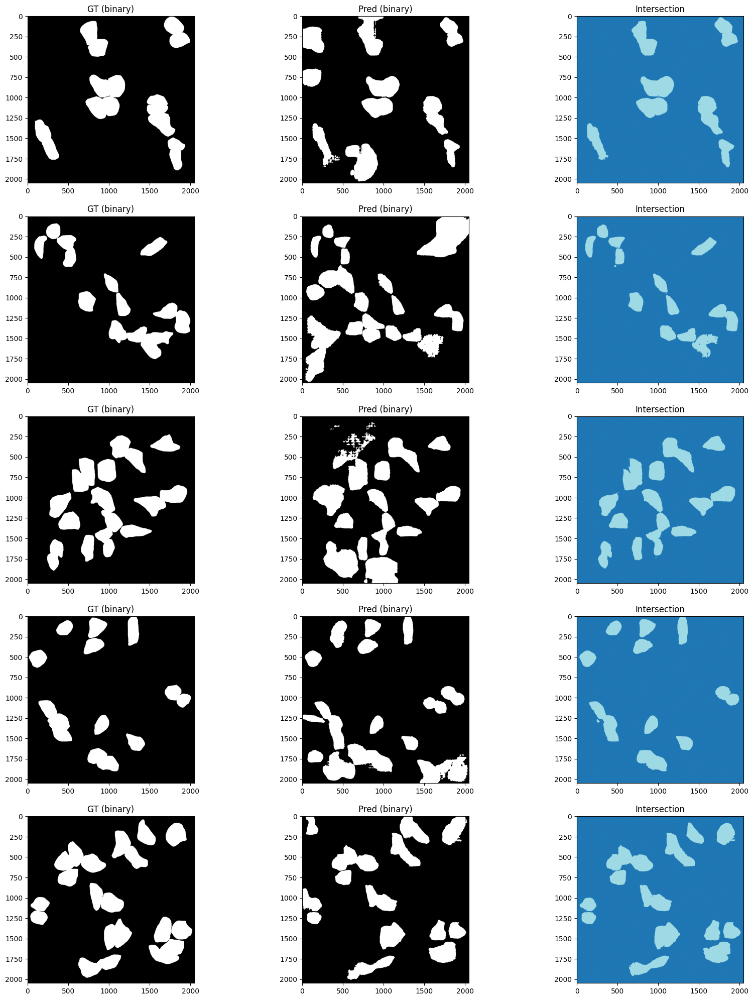

In [38]:
fig, axs = plt.subplots(5, 3, figsize=(20,25))

for index in range(5):
    axs[index, 0].imshow(all_gt_bt_masks[index], cmap="gray")
    axs[index, 0].set_title("GT (binary)")

    axs[index, 1].imshow(all_pred_bt_masks[index], cmap="gray")
    axs[index, 1].set_title("Pred (binary)")

    axs[index, 2].imshow(all_gt_bt_masks[index] & all_pred_bt_masks[index], cmap="tab20")
    axs[index,2].set_title("Intersection")

plt.show()

## First Attempt of Instance Segmentation

## EXP251009COLB02

In [46]:
seg_iou_metrics = []
seg_dice_metrics = []

all_pred_bt_masks = []
all_gt_bt_masks = []

all_gt_instance_masks = []
all_pred_instance_masks = []

instance_iou_metrics = []
instance_dice_metrics = []
precisions = []
recalls = []
f1s = []

In [34]:
path_B02 = "Z:/Guohao/For Computation group/EXP251009COL/EXP251009COLB02"
chnl_dapi = []
chnl_488 = []
chnl_647 = []

with os.scandir(path_B02) as entries:
    for entry in entries:
        if "DAPI" in entry.name:
            chnl_dapi.append(entry.name)
        elif "488" in entry.name:
            chnl_488.append(entry.name)
        elif "647" in entry.name:
            chnl_647.append(entry.name)


chnl_dapi = sorted(chnl_dapi)
chnl_488 = sorted(chnl_488)
chnl_647 = sorted(chnl_647)

In [43]:
def gt_instances_from_label(inst_mask):
    ids = np.unique(inst_mask)
    ids = ids[ids != 0]
    return [(inst_mask == i).astype(np.uint8) for i in ids]

def pred_instances_from_list(masks_488):
    return [(m > 0).astype(np.uint8) for m in masks_488]

def compute_iou(a, b):
    a = a.astype(bool); b = b.astype(bool)
    inter = np.logical_and(a, b).sum()
    union = np.logical_or(a, b).sum()
    return inter / union if union > 0 else 0.0

def compute_dice(a, b):
    a = a.astype(bool)
    b = b.astype(bool)
    inter = np.logical_and(a, b).sum()
    denom = a.sum() + b.sum()
    return (2 * inter / denom) if denom > 0 else 0.0

def instance_metrics_one_image(gt_instances, pred_instances, iou_thresh=0.5):
    nG, nP = len(gt_instances), len(pred_instances)
    print("Type of nG", type(nG))
    print("Type of nP", type(nP))

    # Handle empty cases
    if nG == 0 and nP == 0:
        return {"TP": 0, "FP": 0, "FN": 0, "precision": 1.0, "recall": 1.0, "f1": 1.0,
                "mean_iou": 1.0, "mean_dice": 1.0, "matches": []}
    if nG == 0:
        return {"TP": 0, "FP": nP, "FN": 0, "precision": 0.0, "recall": 0.0, "f1": 0.0,
                "mean_iou": 0.0, "mean_dice": 0.0, "matches": []}
    if nP == 0:
        return {"TP": 0, "FP": 0, "FN": nG, "precision": 0.0, "recall": 0.0, "f1": 0.0,
                "mean_iou": 0.0, "mean_dice": 0.0, "matches": []}

    # IoU matrix
    iou_mat = np.zeros((nP, nG), dtype=np.float32)
    for p in range(nP):
        for g in range(nG):
            iou_mat[p, g] = compute_iou(pred_instances[p], gt_instances[g])

    # Greedy matching by IoU desc (one-to-one)
    pairs = [(p, g, float(iou_mat[p, g])) for p in range(nP) for g in range(nG)]
    pairs.sort(key=lambda x: x[2], reverse=True)

    used_p, used_g = set(), set()
    matches = []  # (pred_idx, gt_idx, iou, dice)

    for p, g, val in pairs:
        if val < iou_thresh:
            break
        if p in used_p or g in used_g:
            continue
        used_p.add(p)
        used_g.add(g)
        matches.append((p, g, val, float(compute_dice(pred_instances[p], gt_instances[g]))))

    TP = len(matches)
    FP = nP - TP
    FN = nG - TP

    precision = TP / (TP + FP) if (TP + FP) else 0.0
    recall = TP / (TP + FN) if (TP + FN) else 0.0
    f1 = (2*precision*recall/(precision+recall)) if (precision+recall) else 0.0

    mean_iou = float(np.mean([m[2] for m in matches])) if matches else 0.0
    mean_dice = float(np.mean([m[3] for m in matches])) if matches else 0.0

    return {
        "TP": TP, "FP": FP, "FN": FN,
        "precision": precision, "recall": recall, "f1": f1,
        "mean_iou": mean_iou, "mean_dice": mean_dice,
        "matches": matches,
    }

def calculate_instance_metrics(inst_mask, masks_488):
    gt_instances = gt_instances_from_label(inst_mask)          # list of GT masks
    pred_instances = pred_instances_from_list(masks_488)       # list of pred masks

    all_gt_instance_masks.append(gt_instances)
    all_pred_instance_masks.append(pred_instances)

    out = instance_metrics_one_image(gt_instances, pred_instances, iou_thresh=0.5)

    return out

Estimated Gaussian noise standard deviation = 6.610529101944879
Estimated Gaussian noise standard deviation = 28.369727831187067
DEBUG: Running dino_bbox


DEBUG: DINO predicted 43 boxes
[CYTO] Starting prediction for 20 cells
[CYTO] Input image shape: (2048, 2048, 3), dtype: uint8
[CYTO] Using pre-formatted 3-channel image as RGB
[CYTO] Processing box [840.0, 1100.0, 1025.0, 1379.0]
[CYTO] Processing box [1086.0, 490.0, 1243.0, 708.0]
[CYTO] Processing box [1563.0, 538.0, 1772.0, 729.0]
[CYTO] Processing box [1285.0, 69.0, 1538.0, 228.0]
[CYTO] Processing box [1287.0, 359.0, 1501.0, 665.0]
[CYTO] Processing box [1453.0, 1848.0, 1650.0, 2047.0]
[CYTO] Processing box [1754.0, 679.0, 2047.0, 978.0]
[CYTO] Processing box [1597.0, 887.0, 1823.0, 1126.0]
[CYTO] Processing box [803.0, 1523.0, 1032.0, 1734.0]
[CYTO] Processing box [74.0, 1656.0, 297.0, 1843.0]
[CYTO] Processing box [1078.0, 264.0, 1287.0, 492.0]
[CYTO] Processing box [961.0, 1772.0, 1182.0, 1976.0]
[CYTO] Processing box [259.0, 1085.0, 501.0, 1341.0]
[CYTO] Processing box [1009.0, 61.0, 1153.0, 294.0]
[CYTO] Processing box [95.0, 1219.0, 312.0, 1401.0]
[CYTO] Processing box [180

FileNotFoundError: [Errno 2] No such file or directory: 'Z:\\Guohao\\For Computation group\\EXP251009COL\\EXP251009COLB02\\MAXEXP251009COLB02_w1-DAPI_s004.tif'

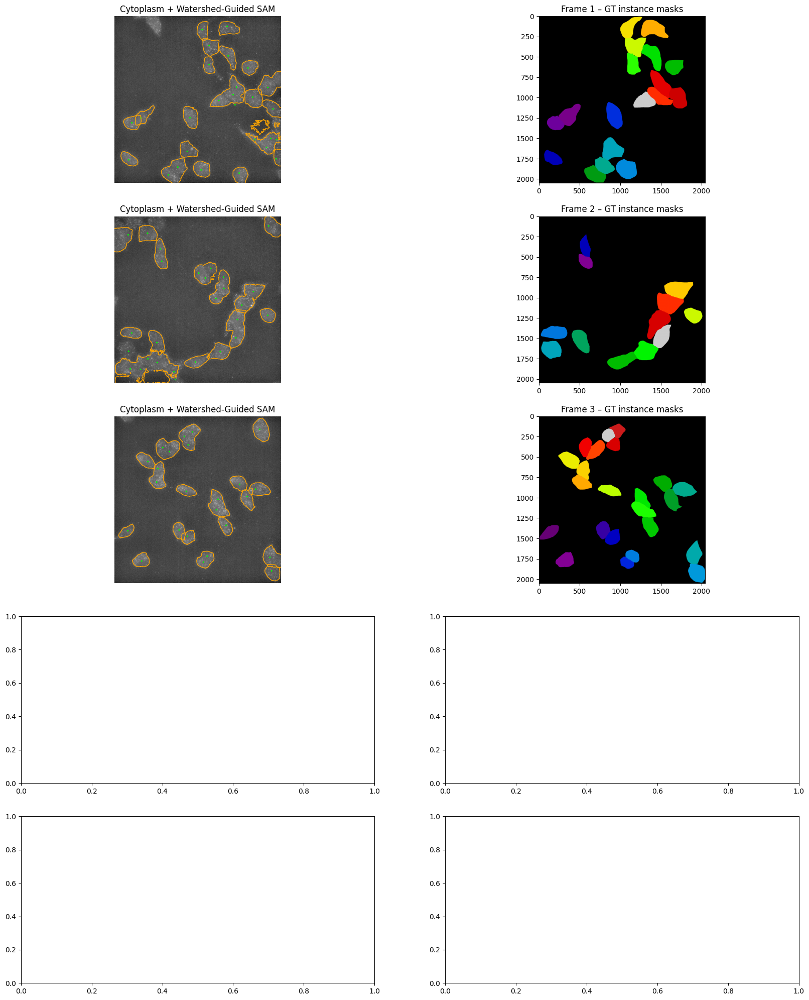

In [44]:
# --- USE THIS IF YOU WANT IT ALL IN ONE GO ---
mat_B02 = "Track251009COLB02"
dir_B02 = dirnames[mat_B02]

track = mat[mat_B02] # Makes a new track 
num_frames = track.shape[1] # Number of images in the directory
frame_converted = convert(track[0])

fig, ax = plt.subplots(5, 2, figsize=(20,25))

for index in range(num_frames): # Loops over all frames in folder

    # ----- GDINO + SAM -----

    # Get correct DAPI, 488, and 647 frames
    path_dapi = os.path.join(path_B02, chnl_dapi[index])
    path_488 = os.path.join(path_B02, chnl_488[index])
    path_647 = os.path.join(path_B02, chnl_647[index])

    nucleus = open_tiff_file(path_dapi)
    img_488 = open_tiff_file(path_488)
    img_647 = open_tiff_file(path_647)

    masks_488, centers_488, clahe_488 = segment_channel(nucleus, img_488) # Just 488 for now
    # masks_647, centers_647 = segment_channel(nucleus, img_647)

    # Cytoplasm + masks
    ax[index, 0].imshow(clahe_488, cmap='gray')
    ax[index, 0].set_title("Cytoplasm + Watershed-Guided SAM")
    ax[index, 0].axis('off')
    for mask in masks_488:
        for contour in measure.find_contours(mask, 0.5):
            ax[index, 0].plot(contour[:, 1], contour[:, 0], linewidth=1, color='orange')
    # Debug: plot all nucleus centers in cytoplasm plot
    for (cx, cy) in centers_488:
        ax[index, 0].add_patch(Circle((cx, cy), radius=5, color='lime', fill=True))

    # ----- GT MASKS -----
    rec = track[0, index][0, 0]
    inst_mask = reconstruct_instance_mask(rec, H, W) # This function calls getCells to calculate instance masks
    ax[index, 1].imshow(inst_mask, cmap="nipy_spectral")
    ax[index, 1].set_title(f"Frame {index + 1} – GT instance masks")

    # ----- CALCULATE AND STORE METRICS AND BT MASKS -----
    iou, dice, gt_binary, pred_binary = calculate_semantic_metrics(masks_488, inst_mask)

    seg_iou_metrics.append(iou)
    seg_dice_metrics.append(dice)
    all_gt_bt_masks.append(gt_binary)
    all_pred_bt_masks.append(pred_binary)

    out = calculate_instance_metrics(inst_mask, masks_488)

    instance_iou_metrics.append(out["mean_iou"])
    instance_dice_metrics.append(out["mean_dice"])
    precisions.append(out["precision"])
    recalls.append(out["recall"])
    f1s.append(out["f1"])

plt.axis("off")
plt.tight_layout()
plt.show()


In [45]:
print("Sematnic mean IoU:", np.mean(seg_iou_metrics))
print("Semantic mean Dice:", np.mean(seg_dice_metrics))

print()

print("All of Semantic mean IOU", seg_iou_metrics)
print("All of Semantic mean Dice", seg_dice_metrics)

print(len(all_pred_bt_masks))

Sematnic mean IoU: 0.5354947303678127
Semantic mean Dice: 0.6863457473804183

All of Semantic mean IOU [0.5562800006421542, 0.3577005137623065, 0.7424927628667021, 0.42417991580231057, 0.5468313725978655, 0.5562800006421542, 0.3577005137623065, 0.7424927628667021]
All of Semantic mean Dice [0.7148842115976832, 0.5269210847848723, 0.8522190492718867, 0.5956830469180562, 0.707034240816406, 0.7148842115976832, 0.5269210847848723, 0.8522190492718867]
8


In [42]:
def describe(name, seq):
    print(f"\n{name}: len={len(seq)}")
    for i, item in enumerate(seq):
        if isinstance(item, np.ndarray):
            print(i, "ndarray", item.shape, item.dtype, "min/max", item.min(), item.max())
        elif isinstance(item, list):
            print(i, "list", f"len={len(item)}",
                  "elem0 type" if len(item)>0 else "EMPTY",
                  type(item[0]).__name__ if len(item)>0 else "")
        else:
            print(i, type(item).__name__)

describe("GT", all_gt_bt_masks)
describe("PRED", all_pred_bt_masks)



GT: len=10
0 ndarray (2048, 2048) uint8 min/max 0 1
1 list len=18 elem0 type ndarray
2 ndarray (2048, 2048) uint8 min/max 0 1
3 list len=12 elem0 type ndarray
4 ndarray (2048, 2048) uint8 min/max 0 1
5 list len=23 elem0 type ndarray
6 ndarray (2048, 2048) uint8 min/max 0 1
7 list len=10 elem0 type ndarray
8 ndarray (2048, 2048) uint8 min/max 0 1
9 list len=19 elem0 type ndarray

PRED: len=5
0 ndarray (2048, 2048) uint8 min/max 0 1
1 ndarray (2048, 2048) uint8 min/max 0 1
2 ndarray (2048, 2048) uint8 min/max 0 1
3 ndarray (2048, 2048) uint8 min/max 0 1
4 ndarray (2048, 2048) uint8 min/max 0 1


5
<class 'numpy.ndarray'> (2048, 2048) uint8
<class 'list'> None None


TypeError: Invalid shape (18, 2048, 2048) for image data

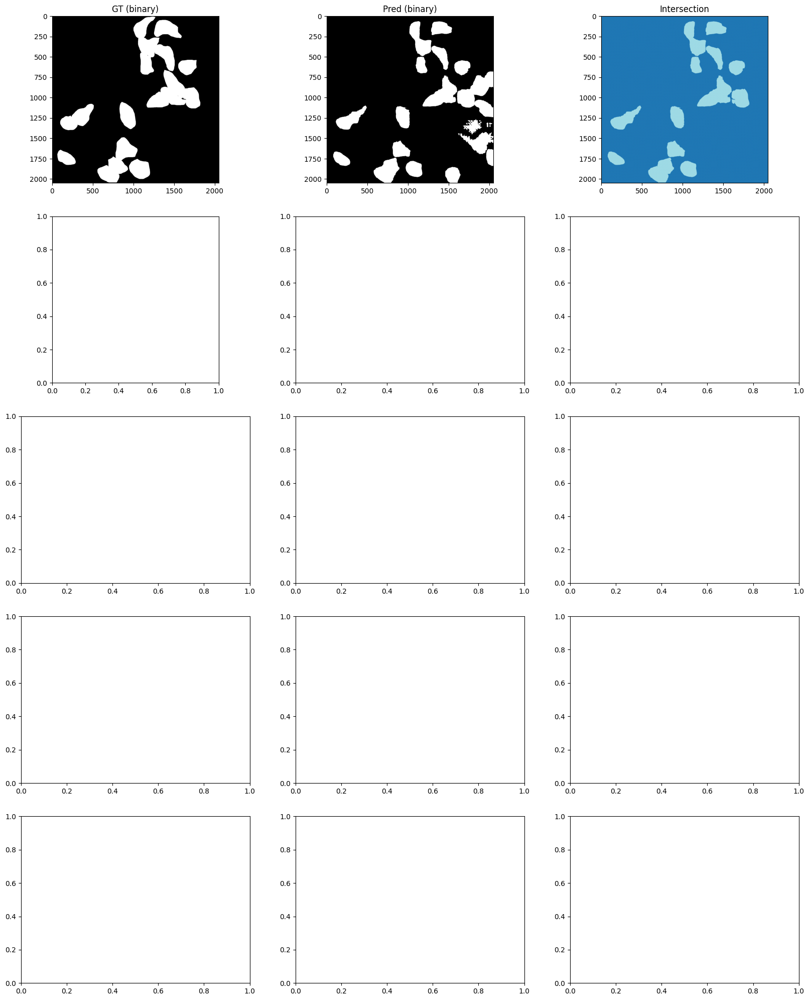

In [ ]:
fig, axs = plt.subplots(5, 3, figsize=(20,25))

for index in range(5):
    x = all_gt_bt_masks[index]
    print(type(x), getattr(x, "shape", None), getattr(x, "dtype", None))

    axs[index, 0].imshow(all_gt_bt_masks[index], cmap="gray")
    axs[index, 0].set_title("GT (binary)")

    axs[index, 1].imshow(all_pred_bt_masks[index], cmap="gray")
    axs[index, 1].set_title("Pred (binary)")

    axs[index, 2].imshow(all_gt_bt_masks[index] & all_pred_bt_masks[index], cmap="tab20")
    axs[index, 2].set_title("Intersection")

plt.show()

In [57]:
print("Instance mean IoU:", np.mean(instance_iou_metrics))
print("Instance mean Dice:", np.mean(instance_dice_metrics))
print("Instance Precision:", np.mean(precisions))
print("Instance Recall:", np.mean(recalls))
print("Instance F1:", np.mean(f1s))


print(instance_dice_metrics)
print(precisions)
print(recalls)
print(f1s)
print(instance_iou_metrics)

Instance mean IoU: 0.7211129737506201
Instance mean Dice: 0.8354427222811307
Instance Precision: 0.5776761980709348
Instance Recall: 0.5793160437325198
Instance F1: 0.5748658701161911
[0.8127767122184419, 0.846919214115605, 0.8377533710010107, 0.8127767122184419, 0.846919214115605, 0.8377533710010107, 0.828719754554447, 0.859923429024484]
[0.65, 0.35714285714285715, 0.7222222222222222, 0.65, 0.35714285714285715, 0.7222222222222222, 0.6363636363636364, 0.5263157894736842]
[0.7222222222222222, 0.4166666666666667, 0.5652173913043478, 0.7222222222222222, 0.4166666666666667, 0.5652173913043478, 0.7, 0.5263157894736842]
[0.6842105263157895, 0.3846153846153846, 0.6341463414634146, 0.6842105263157895, 0.3846153846153846, 0.6341463414634146, 0.6666666666666666, 0.5263157894736842]
[0.6884230466989371, 0.7358169198036194, 0.726491208259876, 0.6884230466989371, 0.7358169198036194, 0.726491208259876, 0.7111962863377163, 0.7562451541423798]
